In [1]:
import cv2
import matplotlib.pyplot as plt

from utils import *
from darknet import Darknet

In [2]:
# Set the location and name of the cfg file
cfg_file = 'yolov3.cfg'

# Set the location and name of the pre-trained weights file
weight_file = './weights/yolov3.weights'

# Set the location and name of the COCO object classes file
namesfile = 'coco.names'

# Load the network architecture
m = Darknet(cfg_file)

# Load the pre-trained weights
m.load_weights(weight_file)

# Load the COCO object classes
class_names = load_class_names(namesfile)

In [3]:
# Print the neural network used in YOLOv3
m.print_network()

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  32
    1 conv     64  3 x 3 / 2   416 x 416 x  32   ->   208 x 208 x  64
    2 conv     32  1 x 1 / 1   208 x 208 x  64   ->   208 x 208 x  32
    3 conv     64  3 x 3 / 1   208 x 208 x  32   ->   208 x 208 x  64
    4 shortcut 1
    5 conv    128  3 x 3 / 2   208 x 208 x  64   ->   104 x 104 x 128
    6 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64
    7 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128
    8 shortcut 5
    9 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64
   10 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128
   11 shortcut 8
   12 conv    256  3 x 3 / 2   104 x 104 x 128   ->    52 x  52 x 256
   13 conv    128  1 x 1 / 1    52 x  52 x 256   ->    52 x  52 x 128
   14 conv    256  3 x 3 / 1    52 x  52 x 128   ->    52 x  52 x 256
   15 shortcut 12
   16 conv    128  1 x 1

##  Running YOLO all the images present in images folder



It took 1.996 seconds to detect the objects in the image.

Number of Objects Detected: 3 

Objects Found and Confidence Level:

1. dog: 0.999997
2. truck: 0.991125
3. bicycle: 0.999998


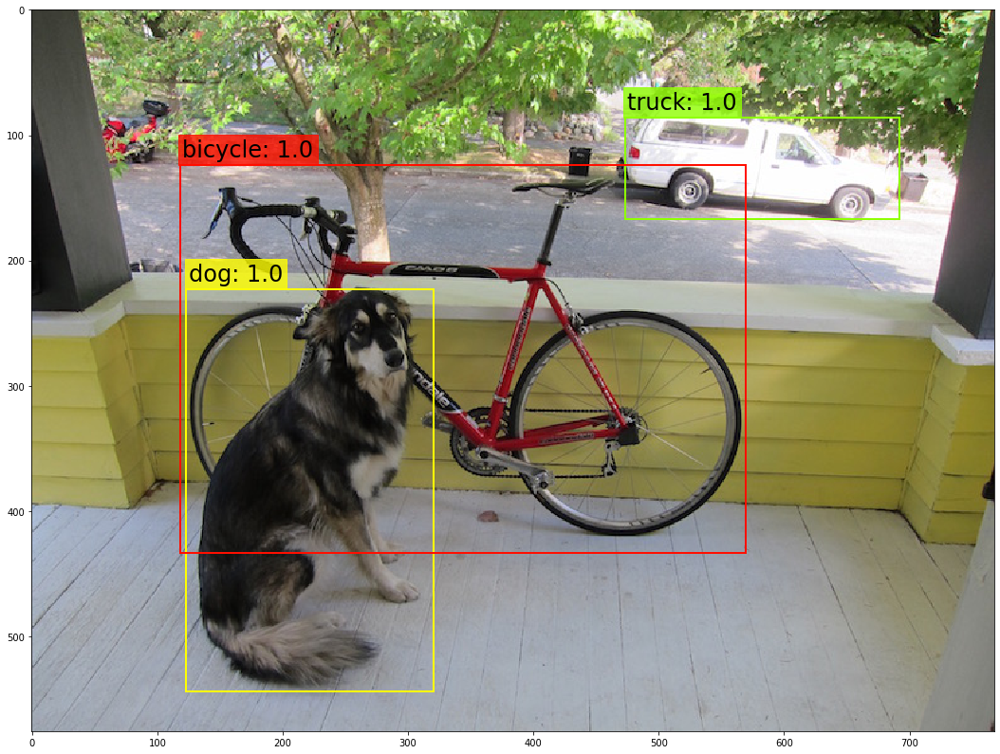



It took 1.784 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. cat: 0.999939


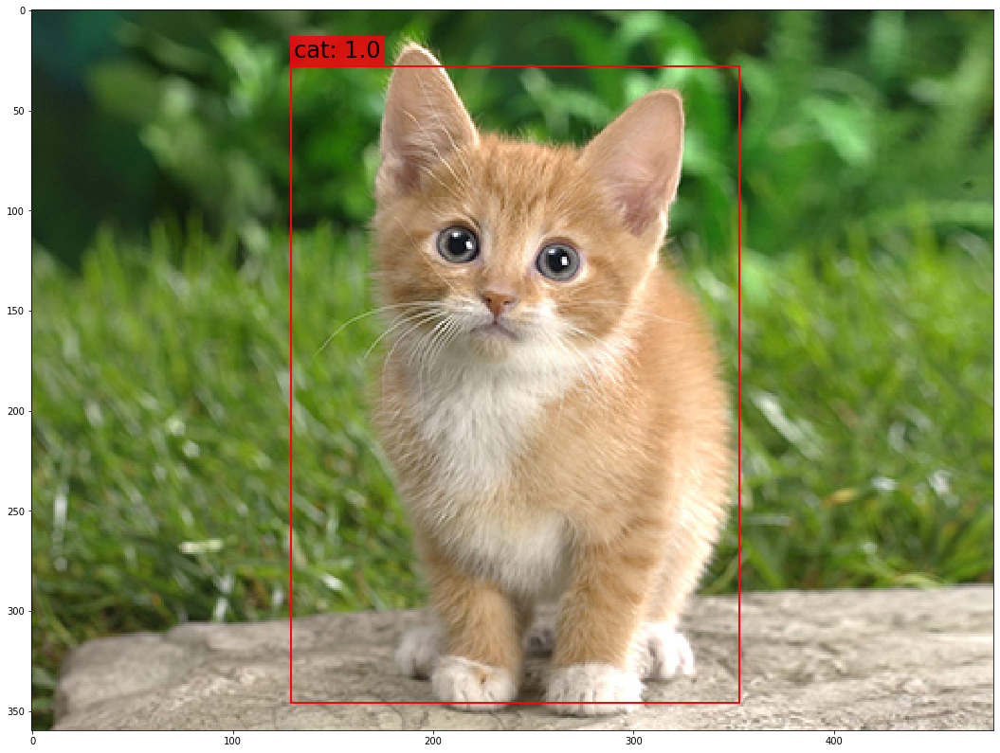



It took 1.880 seconds to detect the objects in the image.

Number of Objects Detected: 28 

Objects Found and Confidence Level:

1. person: 0.999996
2. person: 1.000000
3. truck: 0.949642
4. car: 0.634397
5. car: 0.627128
6. truck: 0.671305
7. traffic light: 1.000000
8. person: 1.000000
9. person: 1.000000
10. car: 0.997258
11. bus: 0.997870
12. person: 1.000000
13. person: 1.000000
14. person: 0.999999
15. person: 1.000000
16. person: 1.000000
17. traffic light: 1.000000
18. traffic light: 1.000000
19. handbag: 0.997166
20. traffic light: 1.000000
21. car: 0.989488
22. traffic light: 1.000000
23. person: 0.999999
24. traffic light: 0.999999
25. traffic light: 1.000000
26. truck: 0.705300
27. person: 0.999993
28. person: 0.999996


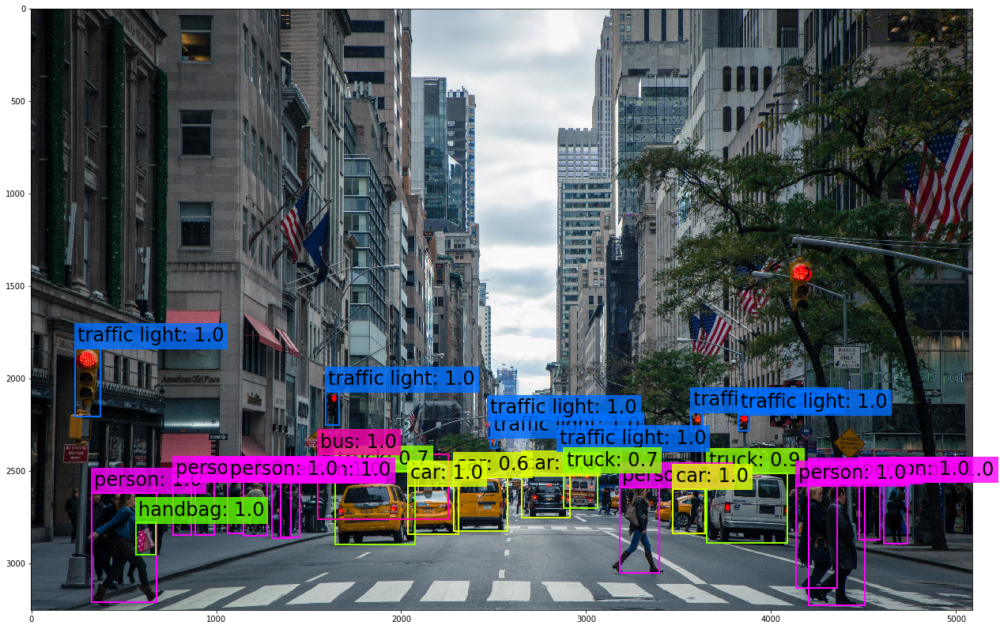



It took 1.851 seconds to detect the objects in the image.

Number of Objects Detected: 4 

Objects Found and Confidence Level:

1. dog: 0.999024
2. bicycle: 0.999822
3. person: 1.000000
4. person: 1.000000


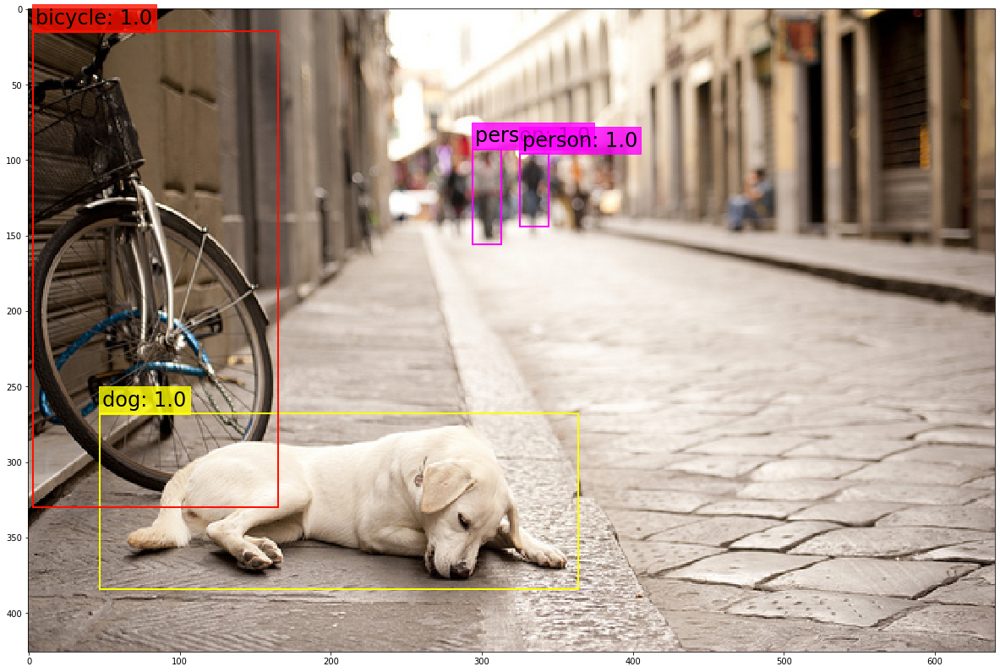



It took 1.762 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. bird: 0.999980


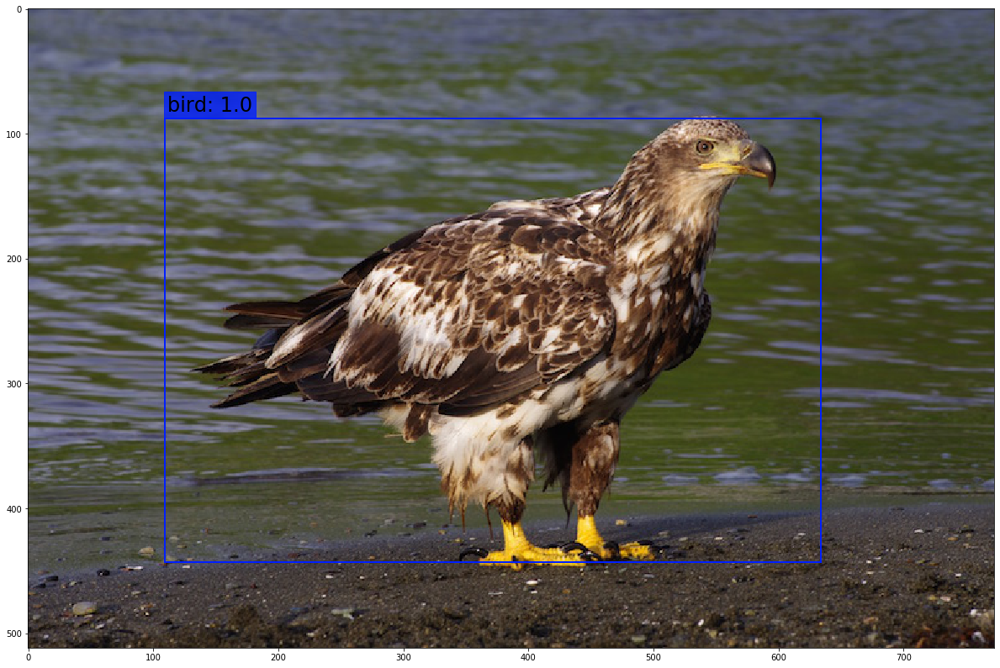



It took 1.830 seconds to detect the objects in the image.

Number of Objects Detected: 17 

Objects Found and Confidence Level:

1. bowl: 0.999978
2. bowl: 0.999683
3. bowl: 0.999968
4. bowl: 0.999995
5. spoon: 0.996659
6. bowl: 0.999998
7. bowl: 0.999983
8. spoon: 0.999949
9. diningtable: 0.999985
10. bowl: 0.999991
11. bowl: 0.999346
12. spoon: 0.999407
13. spoon: 0.943999
14. bowl: 0.999959
15. carrot: 0.999987
16. carrot: 1.000000
17. carrot: 0.999996


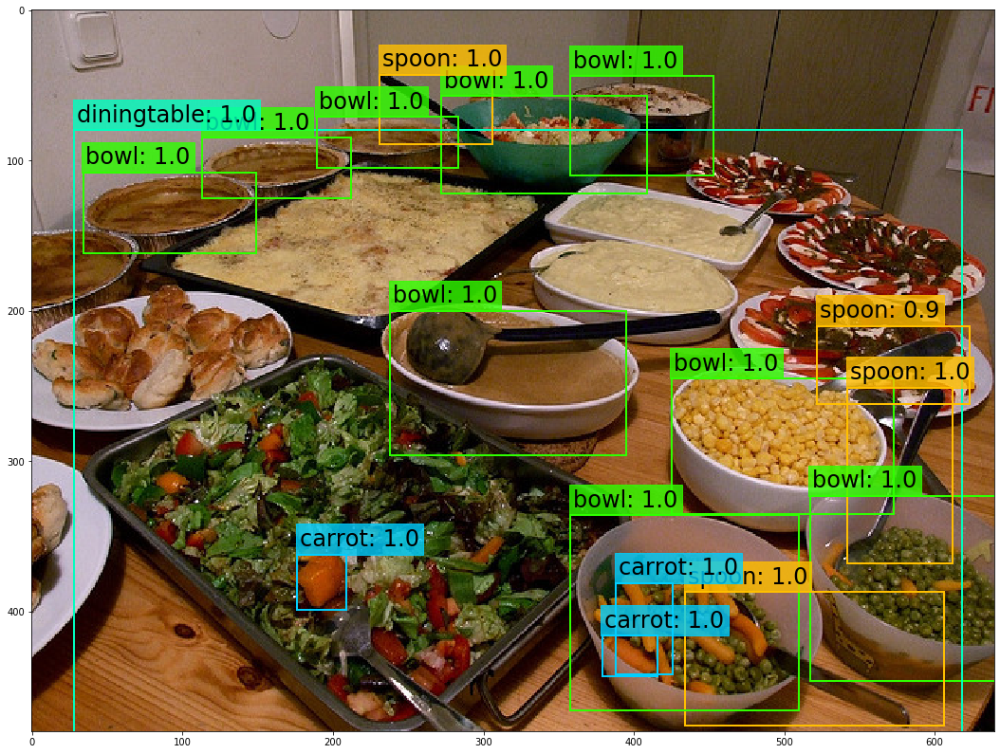



It took 1.809 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. zebra: 0.998162
2. giraffe: 0.999998


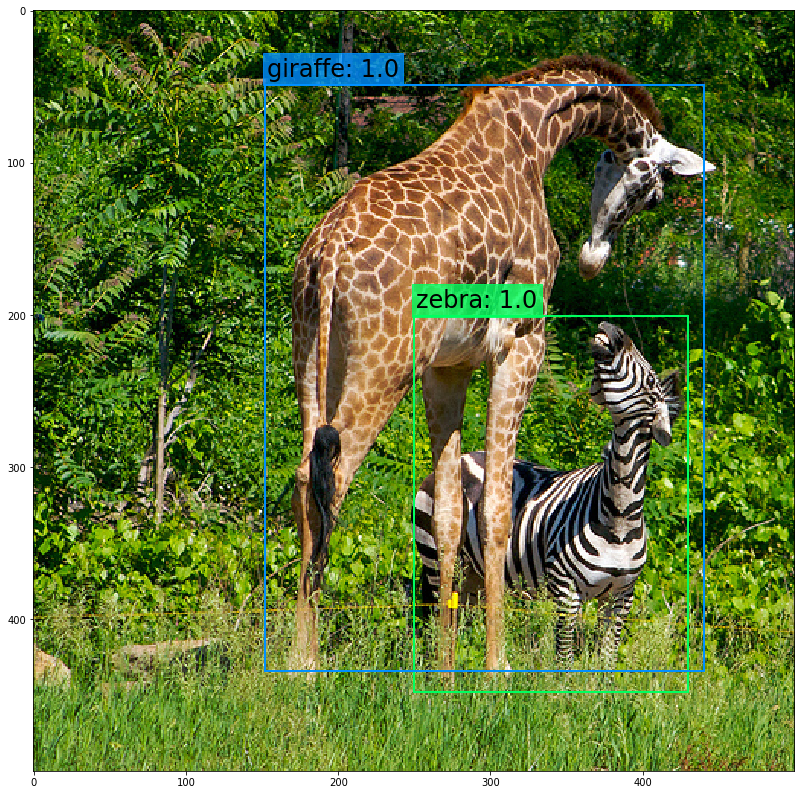



It took 1.907 seconds to detect the objects in the image.

Number of Objects Detected: 4 

Objects Found and Confidence Level:

1. horse: 0.999903
2. horse: 0.997532
3. horse: 0.999994
4. horse: 0.999998


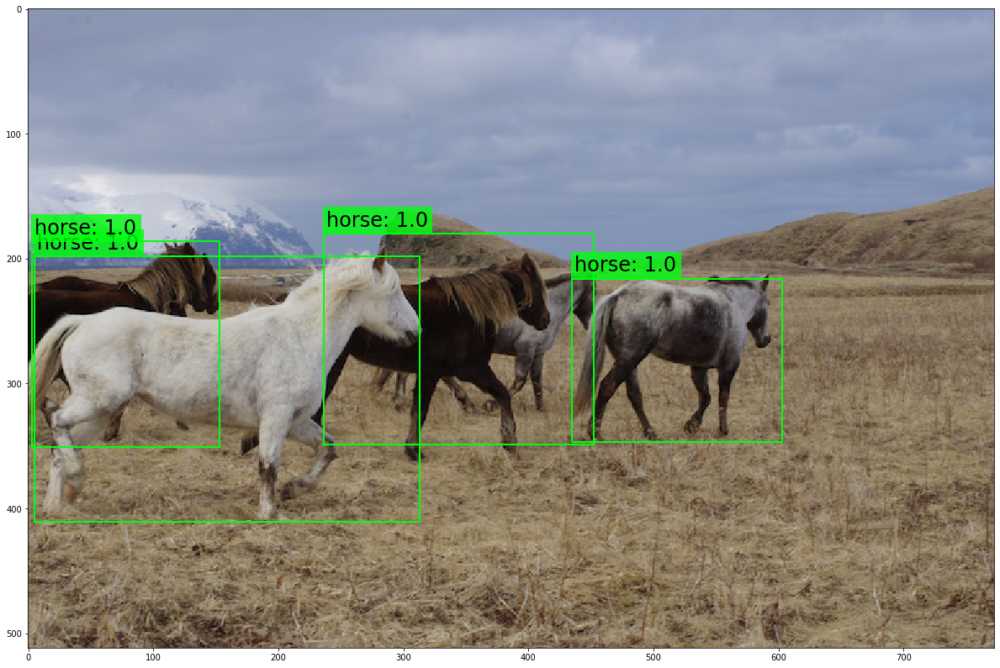



It took 1.818 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. motorbike: 0.999995
2. person: 0.999999


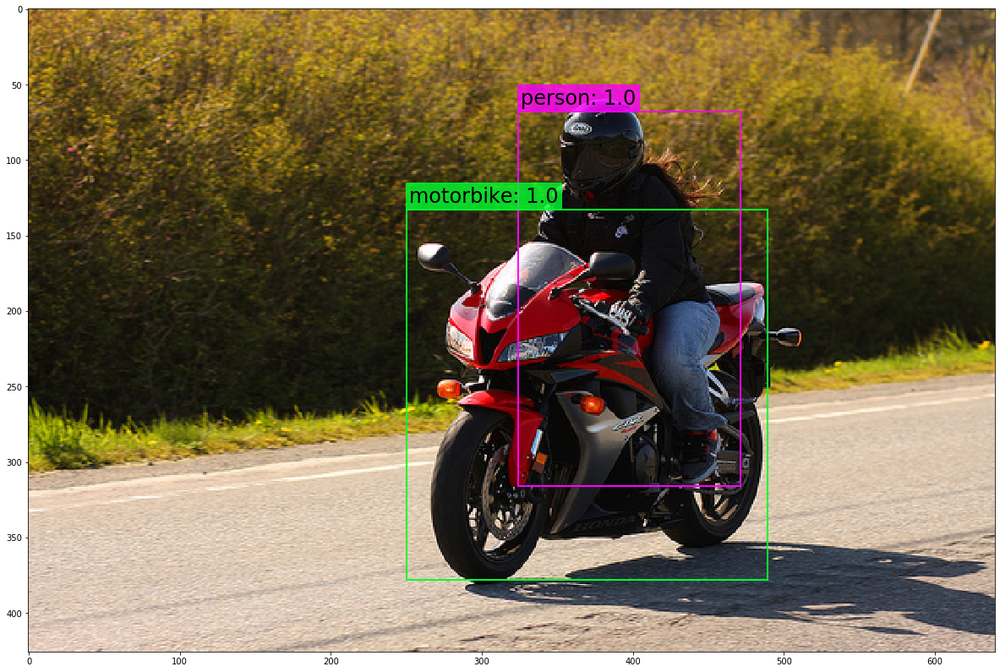



It took 1.825 seconds to detect the objects in the image.

Number of Objects Detected: 3 

Objects Found and Confidence Level:

1. person: 1.000000
2. dog: 0.999986
3. horse: 1.000000


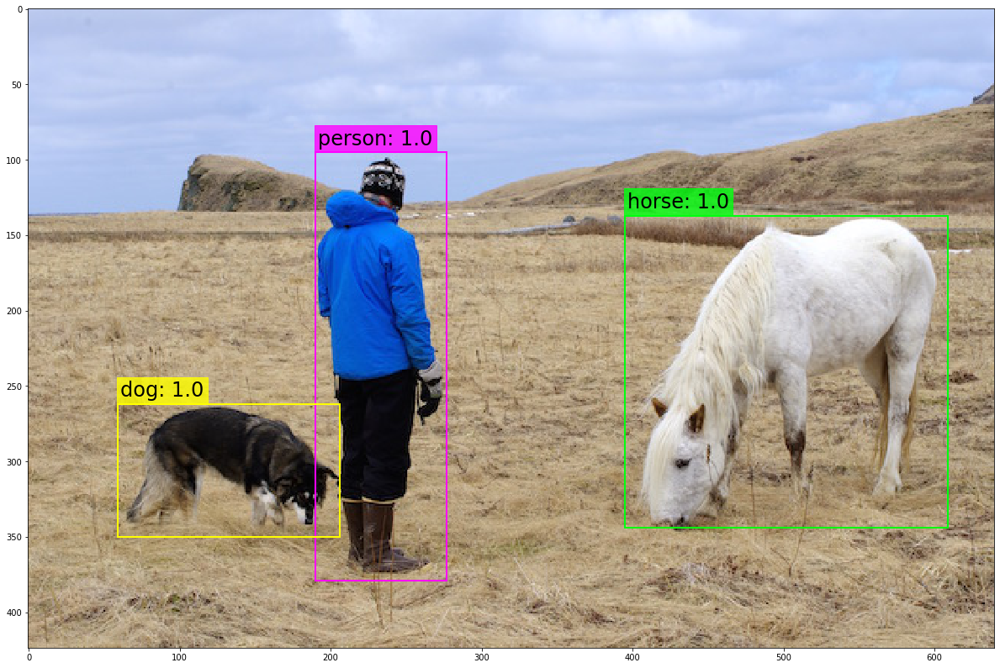



It took 1.863 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. person: 1.000000
2. surfboard: 0.994814


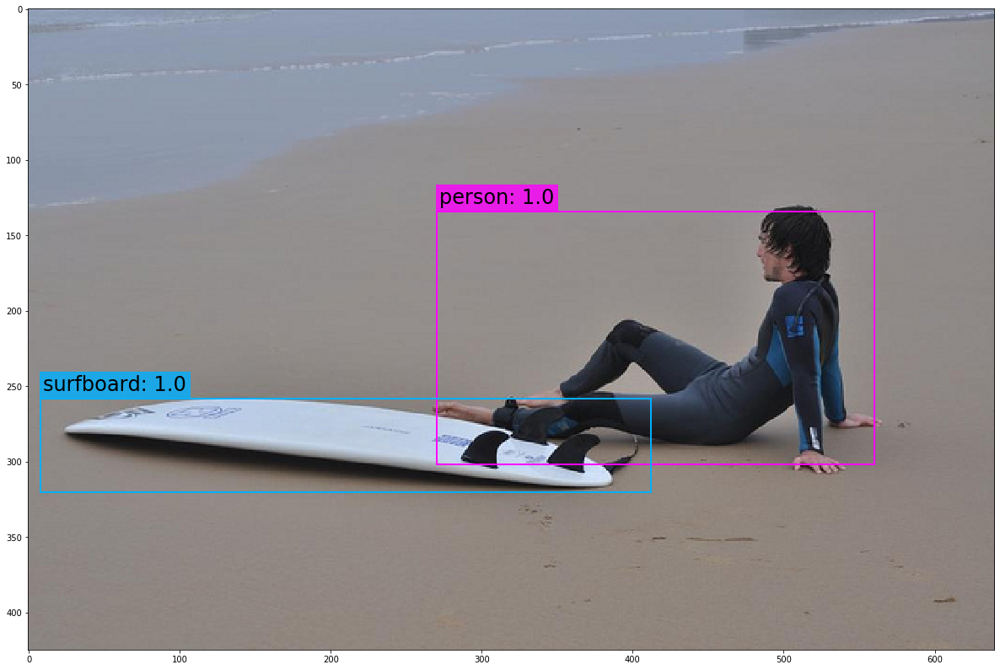



It took 1.875 seconds to detect the objects in the image.

Number of Objects Detected: 3 

Objects Found and Confidence Level:

1. wine glass: 1.000000
2. bottle: 1.000000
3. chair: 0.999749


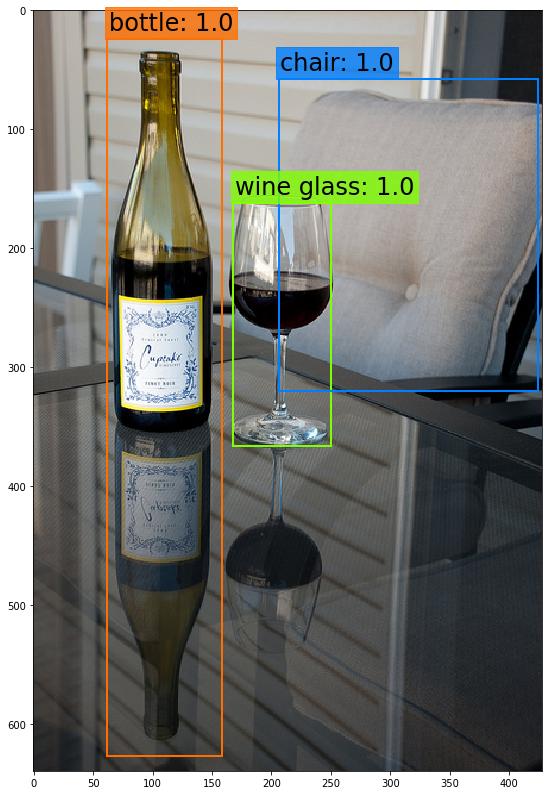

In [4]:
plt.rcParams['figure.figsize'] = [24.0, 14.0]
images_names=['dog','cat','city_scene','dog2','eagle','food','giraffe','horses',
             'motorbike','person','surf','wine']
for i in images_names:
    img = cv2.imread('./images/'+str(i)+'.jpg')
    original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    
    resized_image = cv2.resize(original_image, (m.width, m.height))
    iou_thresh = 0.4
    nms_thresh = 0.6
    boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)
    print_objects(boxes, class_names)
    plot_boxes(original_image, boxes, class_names, plot_labels = True)